# НИРС

## Поиск и выбор набора данных для построения моделей машинного обучения. На основе выбранного набора данных студент должен построить модели машинного обучения для решения или задачи классификации, или задачи регрессии.

В качестве набора данных будет использоваться набор данных со статистикой всех популярных песен в стриминговом сервисе `Spotify`:  
https://www.kaggle.com/datasets/asaniczka/top-spotify-songs-in-73-countries-daily-updated  
Датасет состоит из одного файла:
- universal_top_spotify_songs.csv
В файле есть следующие колонки:
- spotify_id - ID песни в `Spotify` (в анализе использоваться не будет)
- name - название песни
- artists - имена музыкантов-авторов песни, разделены через запятую
- snapshot_date - дата загрузки информации о песне в датасет (служебное поле, использоваться в анализе не будет)
- daily_rank - служебное поле которое не используется в работе
- daily_movement - то же
- weekly_movement - то же
- country - страна, в которой песня обрела наибольшую популярность
- popularity - популярность песни в `Spotify` (метрика от 0 до 100)
- is_explicit - есть ли в песне нецензурное содержание
- duration_ms - длительность песни в миллисекундах
- album_name - название альбома, на котором была выпущена песня
- album_release_date - дата релиза альбома с песней
- danceability - метрика танцевальности песни от 0 до 1
- energy - метрика энергичности песни от 0 до 1
- key - тональность песни (закодированный категориальный признак)
- loudness - средняя громкость песни в децибелах
- mode - мажрная или минорная тональность у песни
- speechiness - метрика количества произнесённых в песне слов от 0 до 1
- acousticness - метрика акустического качества песни от 0 до 1
- instrumentalness - метрика количества инструментала в песне от 0 до 1
- liveness - метрика присутствия аудитории в момент записи песни от 0 до 1
- valence - метрика позитивности песни от 0 до 1
- tempo - темп песни в ударах в минуту
- time_signature - тактовый размер песни (3/4 или 4/4)
В данной работе будет решаться задача **регрессии**. В качестве целевого признака будем использовать поле `popularity`.


## Импорт библиотек

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Загрузка данных

In [30]:
df = pd.read_csv('universal_top_spotify_songs.csv')

## Проведение разведочного анализа данных. Построение графиков, необходимых для понимания структуры данных. Анализ и заполнение пропусков в данных

In [31]:
df.head()

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,7fzHQizxTqy8wTXwlrgPQQ,MILLION DOLLAR BABY,Tommy Richman,1,0,1,NaN,2024-05-17,96,False,...,1,-5.106,0,0.0436,0.098200,0.000215,0.0680,0.927,138.003,4
1,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,Kendrick Lamar,2,0,-1,NaN,2024-05-17,96,True,...,1,-7.001,1,0.0776,0.010700,0.000000,0.1410,0.214,101.061,4
2,2qSkIjg1o9h3YT9RAgYN75,Espresso,Sabrina Carpenter,3,0,0,NaN,2024-05-17,99,True,...,0,-5.478,1,0.0285,0.107000,0.000065,0.1850,0.690,103.969,4
3,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),"Post Malone, Morgan Wallen",4,0,46,NaN,2024-05-17,92,True,...,7,-4.860,1,0.0264,0.007570,0.000000,0.2450,0.731,127.986,4
4,2GxrNKugF82CnoRFbQfzPf,i like the way you kiss me,Artemas,5,0,-1,NaN,2024-05-17,100,False,...,11,-4.263,1,0.0447,0.000938,0.010600,0.0826,0.747,151.647,4


In [32]:
df.shape

(763403, 25)

In [33]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

In [34]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

Удаление дупликатов

In [35]:
df = df.drop_duplicates()

Проверка наличия нулевых значений

In [36]:
df.isnull().sum()

spotify_id                0
name                     27
artists                  27
daily_rank                0
daily_movement            0
weekly_movement           0
country               10307
snapshot_date             0
popularity                0
is_explicit               0
duration_ms               0
album_name              261
album_release_date      261
danceability              0
energy                    0
key                       0
loudness                  0
mode                      0
speechiness               0
acousticness              0
instrumentalness          0
liveness                  0
valence                   0
tempo                     0
time_signature            0
dtype: int64

Согласно описанию датасета, поле `country` равняется `Null`, если песня попала в плейлист `Global Top 50`.
Поэтому, для использования датасета, заменим пустые значения в колонке `country` на строку `"Global"`

In [37]:
df['country'] = df['country'].fillna("Global")
df.isnull().sum()

spotify_id              0
name                   27
artists                27
daily_rank              0
daily_movement          0
weekly_movement         0
country                 0
snapshot_date           0
popularity              0
is_explicit             0
duration_ms             0
album_name            261
album_release_date    261
danceability            0
energy                  0
key                     0
loudness                0
mode                    0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
time_signature          0
dtype: int64

Остальные строки с пропусками удалим.  
Это мотивированно тем, что пропуски имеются в не числовых колонках, которые заменять на самое часто встречающееся значение было бы некорректно.

In [38]:
df = df.dropna()
df.isnull().sum()

spotify_id            0
name                  0
artists               0
daily_rank            0
daily_movement        0
weekly_movement       0
country               0
snapshot_date         0
popularity            0
is_explicit           0
duration_ms           0
album_name            0
album_release_date    0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
time_signature        0
dtype: int64

Так как датасет очень большой (более 700000 строк), сократим его до 5000 строк:

In [39]:
df = df.sample(n=5000, random_state=73)

Снова смотрим состав датасета:

In [40]:
df.head()

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
594957,0PTlHYXWyCeayIw3Tpafdl,عره فافي عامل مغامر - بت انتي حب حياتي,Essam Sasa,38,3,-8,EG,2023-12-03,61,False,...,0,-2.534,0,0.1580,0.4350,0.000000,0.365,0.741,186.088,4
506186,1rXxK89X0XGpIdTB6CwiFu,A Puro Dolor,Gabito Ballesteros,17,-4,-5,MX,2023-12-27,83,False,...,9,-5.358,1,0.0334,0.0632,0.000000,0.198,0.263,129.888,3
154673,05WVKTdZhlIMX4qqMLuo0f,BELLAKEO,"Peso Pluma, Anitta",24,-1,1,PY,2024-04-03,89,True,...,9,-2.834,1,0.1010,0.0562,0.060000,0.153,0.463,180.011,4
172136,2uqYupMHANxnwgeiXTZXzd,Austin,Dasha,48,2,2,Global,2024-03-29,70,True,...,0,-6.743,1,0.0522,0.4640,0.000003,0.108,0.739,114.935,4
417910,7MXVkk9YMctZqd1Srtv4MB,Starboy,"The Weeknd, Daft Punk",15,-1,0,SA,2024-01-20,94,True,...,7,-7.015,1,0.2760,0.1410,0.000006,0.137,0.486,186.003,4


In [41]:
df.shape

(5000, 25)

In [42]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

In [43]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

**Вывод**: удалили лишние колонки из датасета, очистили его от дупликатов и пустых значений.

## Построение графиков для понимания структуры данных

In [44]:
cat_cols = ['is_explicit', 'key', 'mode', 'time_signature'] # категориальные колонки, закодированные в самом датасете

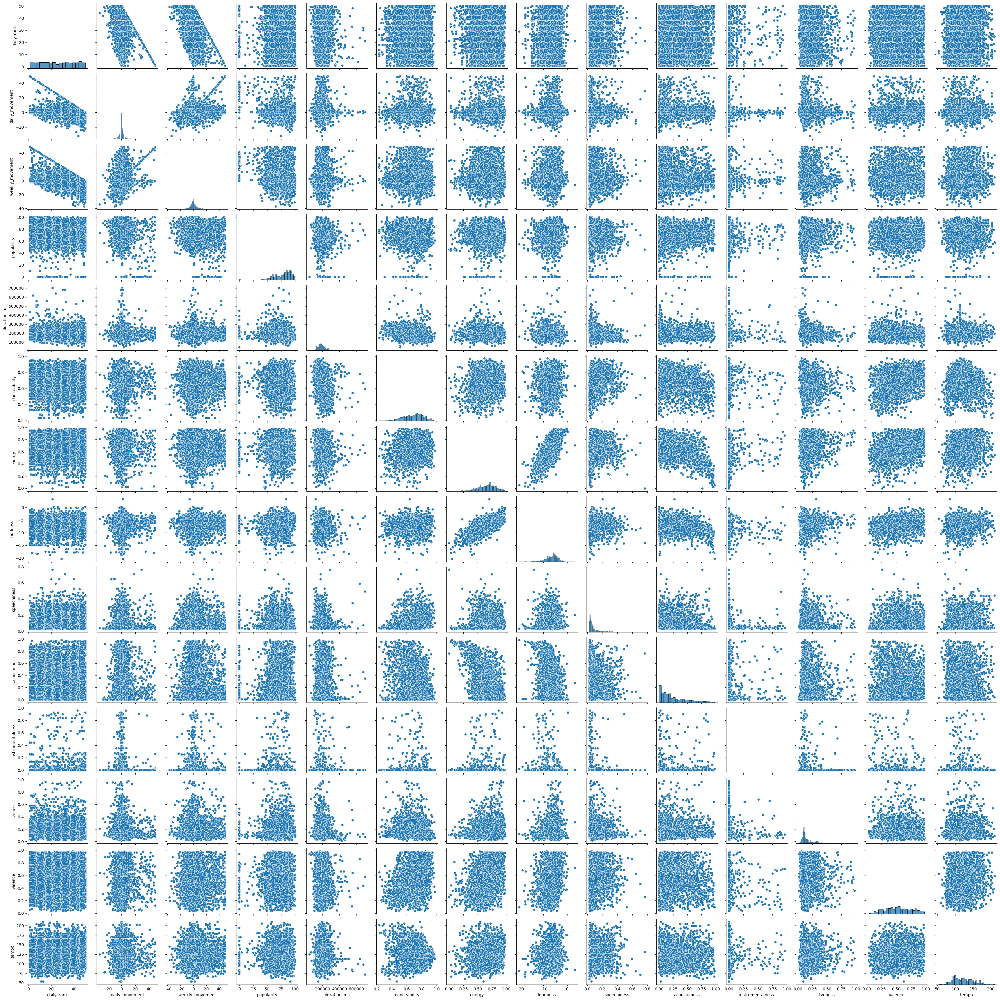

In [45]:
sns.pairplot(df.drop(columns=cat_cols))

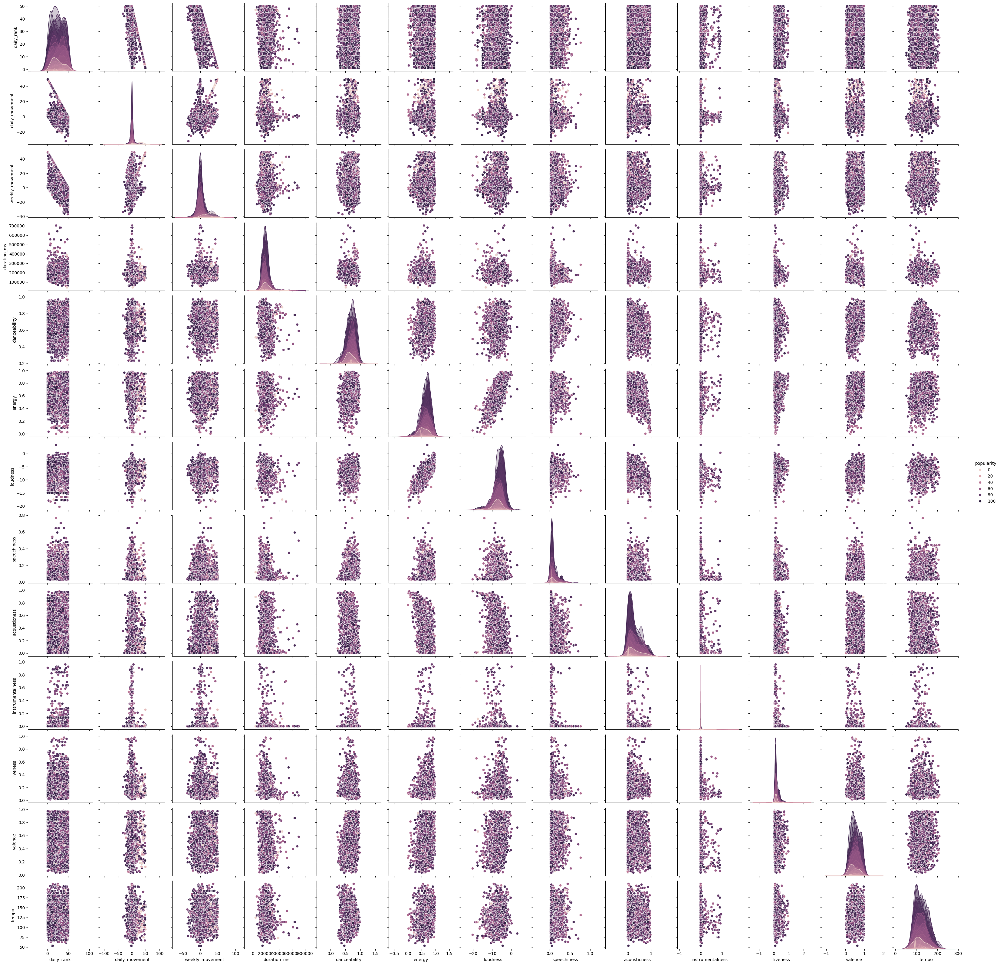

In [46]:
sns.pairplot(df.drop(columns=cat_cols), hue='popularity')

In [47]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

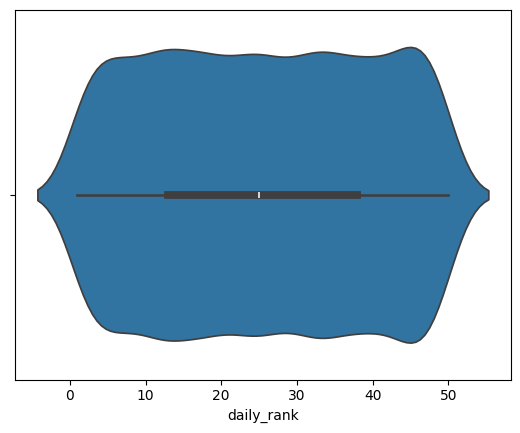

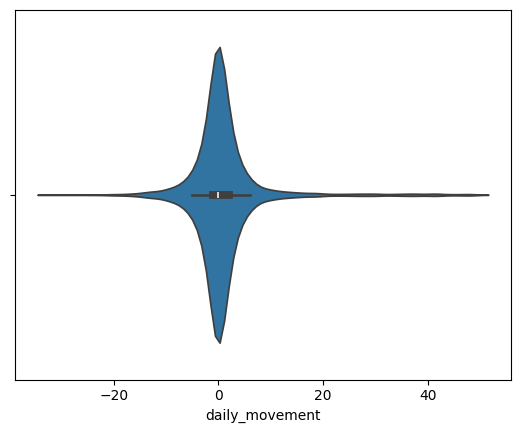

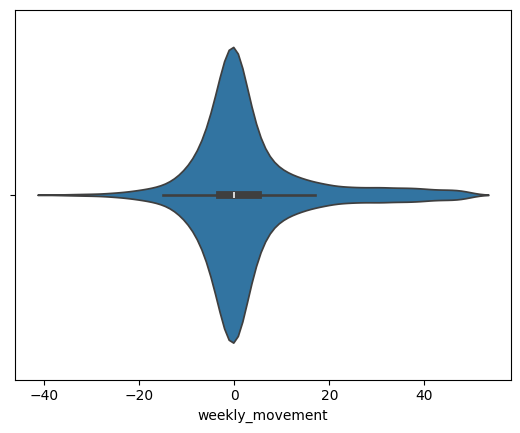

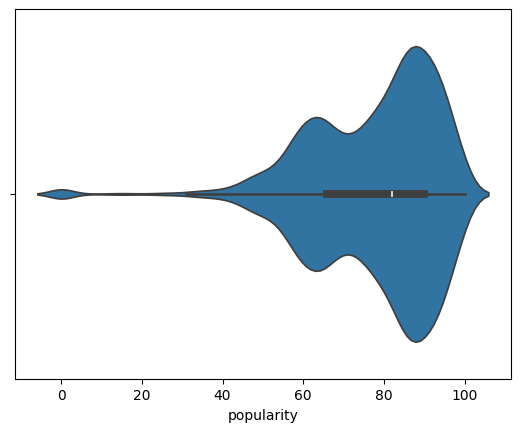

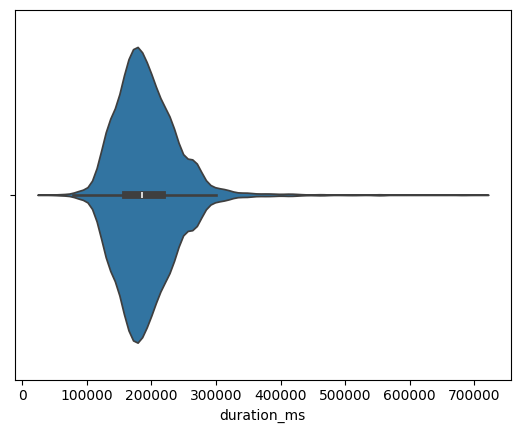

...

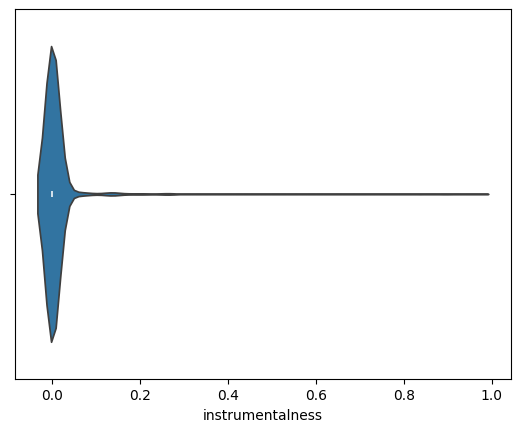

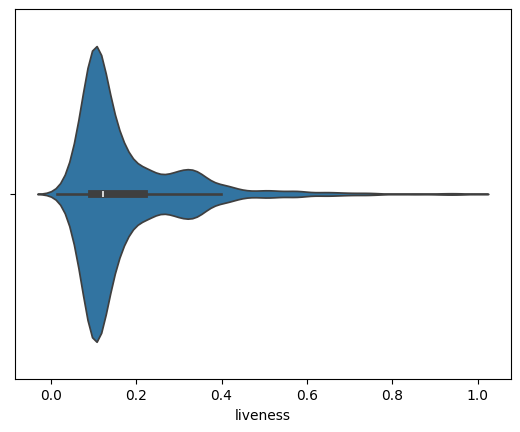

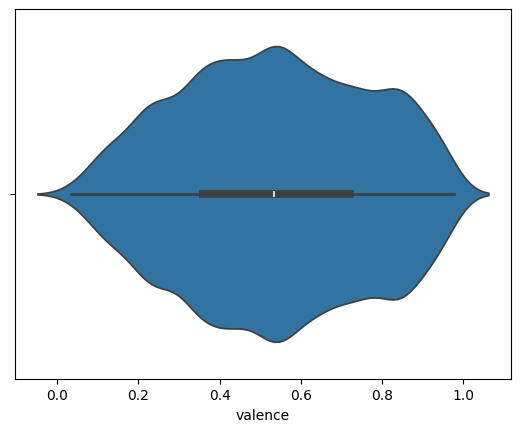

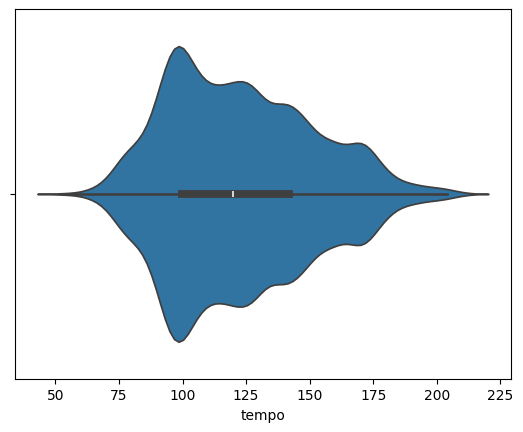

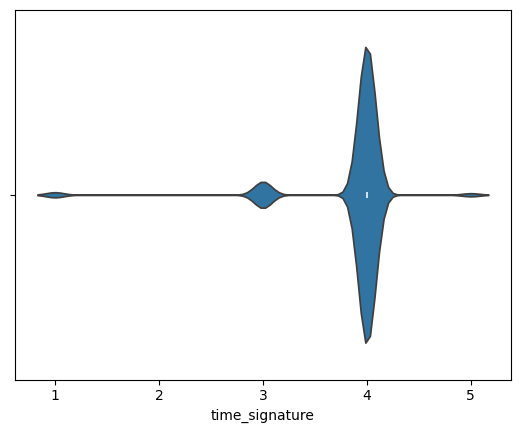

In [48]:
for col in df.columns:
    if str(df[col].dtype) not in ['int64', 'float64']:
        continue
    sns.violinplot(x=df[col])
    plt.show()

## Выбор признаков, подходящих для построения моделей. Кодирование категориальных признаков. Масштабирование данных. Формирование вспомогательных признаков, улучшающих качество моделей.

In [49]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

Удалим из датасета неиспользуемые служебные колонки (`daily_rank`, `daily_movement`, ...).

In [50]:
df = df.drop(columns=['daily_rank', 'daily_movement', 'weekly_movement', 'snapshot_date', 'spotify_id'])

Так же в анализе не будут использоваться такие поля, как `album_name`, `artists` и `name` - так как эти признаки служат для идентифкации отдельных песен, но не представляют ценности именно для анализа данных.
Поле `album_release_date` тоже не будет использоваться, так как мы не рассматриваем датасет как временной ряд. 

In [51]:
df = df.drop(columns=['album_name', 'artists', 'name', 'album_release_date'])

В датасете есть несколько категориальных признаков, но в большинстве своём они уже закодированны.  
Исключением является только колонка `country`, исправим это.

In [52]:
from sklearn.preprocessing import LabelEncoder

country_label_encoder = LabelEncoder()

df['country'] = country_label_encoder.fit_transform(df['country'])

df.head()

,country,popularity,is_explicit,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
594957,20,61,False,216816,0.579,0.900,0,-2.534,0,0.1580,0.4350,0.000000,0.365,0.741,186.088,4
506186,44,83,False,168086,0.743,0.634,9,-5.358,1,0.0334,0.0632,0.000000,0.198,0.263,129.888,3
154673,57,89,True,197333,0.720,0.880,9,-2.834,1,0.1010,0.0562,0.060000,0.153,0.463,180.011,4
172136,27,70,True,171782,0.756,0.672,0,-6.743,1,0.0522,0.4640,0.000003,0.108,0.739,114.935,4
417910,59,94,True,230453,0.679,0.587,7,-7.015,1,0.2760,0.1410,0.000006,0.137,0.486,186.003,4


Проведём масштабирование данных

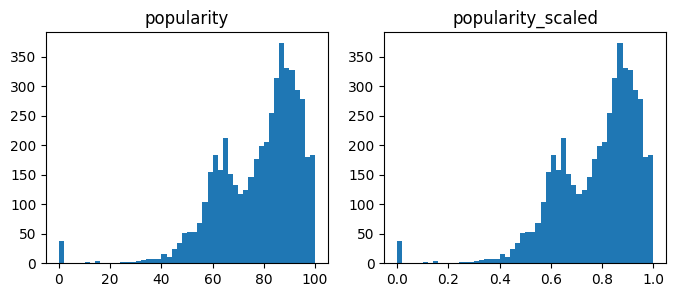

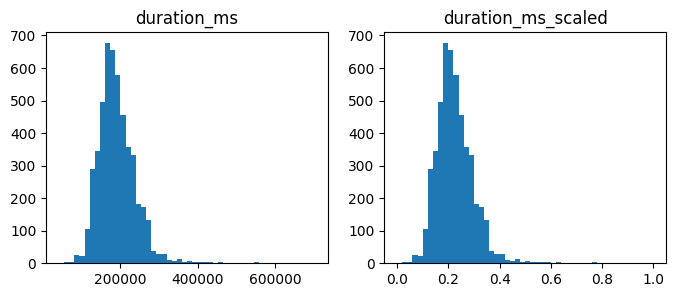

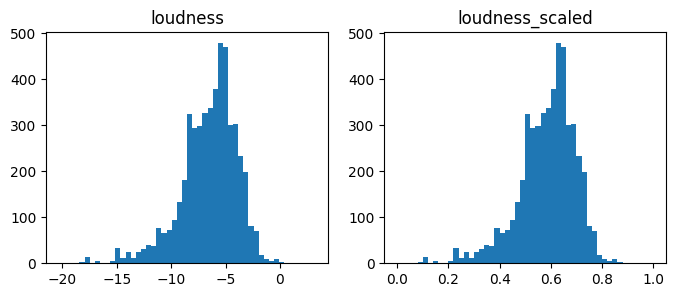

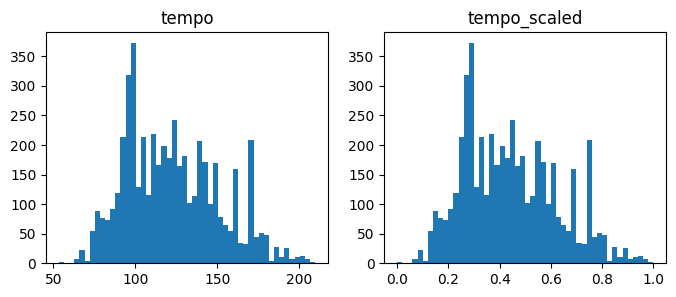

In [60]:
from sklearn.preprocessing import MinMaxScaler

df_scaler = MinMaxScaler()

cols_to_scale = ['popularity', 'duration_ms', 'loudness', 'tempo']

for col in cols_to_scale:
    if str(df[col].dtype) not in ['int64', 'float64']:
        continue

    fig, ax = plt.subplots(1, 2, figsize=(8,3))
    ax[0].hist(df[col], 50)
    ax[0].title.set_text(col)
    
    df[[col]] = df_scaler.fit_transform(df[[col]])
    
    ax[1].hist(df[col], 50)
    ax[1].title.set_text(col + '_scaled')
    plt.show()


In [61]:
df.head()

,country,popularity,is_explicit,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
594957,20,0.61,False,0.264224,0.579,0.900,0,0.755013,0,0.1580,0.4350,0.000000,0.365,0.741,0.848369,4
506186,44,0.83,False,0.190502,0.743,0.634,9,0.635047,1,0.0334,0.0632,0.000000,0.198,0.263,0.489107,3
154673,57,0.89,True,0.234749,0.720,0.880,9,0.742268,1,0.1010,0.0562,0.060000,0.153,0.463,0.809521,4
172136,27,0.70,True,0.196093,0.756,0.672,0,0.576211,1,0.0522,0.4640,0.000003,0.108,0.739,0.393519,4
417910,59,0.94,True,0.284856,0.679,0.587,7,0.564656,1,0.2760,0.1410,0.000006,0.137,0.486,0.847825,4


## Проведение корреляционного анализа данных. Формирование промежуточных выводов о возможности построения моделей машинного обучения.

In [66]:
corr_cols = list(df.columns)
corr_cols.remove('is_explicit')
corr_cols

['country',
 'popularity',
 'duration_ms',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature']

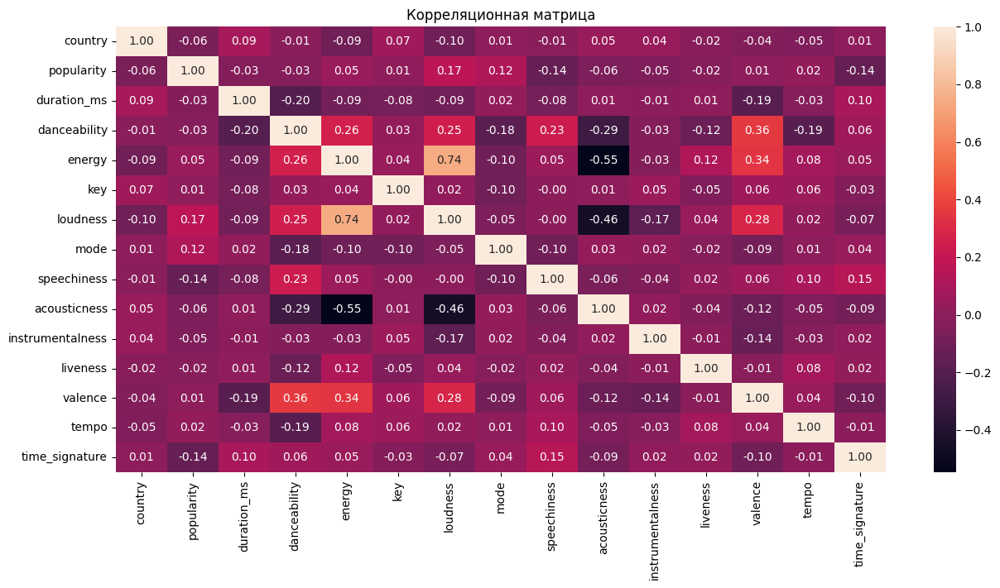

In [73]:
fig, ax = plt.subplots(figsize=(15,7))
sns.heatmap(df[corr_cols].corr(), annot=True, fmt='.2f')
ax.set_title('Корреляционная матрица')
plt.show()

На основе корреляционной матрицы можно сделать следующие выводы:
- мяу
- мяу мяу мяу
- мяу мяу

## Выбор метрик для последующей оценки качества моделей

### В качестве метрик для решения задачи регрессии будем использовать:
Mean absolute error - средняя абсолютная ошибка
$$MAE(y,\hat{y})=\frac{1}{N}\Sigma^{N}_{i=1}|y_i−\hat{y_i}|$$
где:

$$y\text{ - истинное значение целевого признака} $$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$

Чем ближе значение к нулю, тем лучше качество регрессии.

Основная проблема метрики состоит в том, что она не нормирована.

Вычисляется с помощью функции mean_absolute_error.

Mean squared error - средняя квадратичная ошибка
$$MSE(y,\hat{y})=\frac{1}{N}\Sigma^{N}_{i=1}(y_i−\hat{y_i})2$$
где:

$$y \text{- истинное значение целевого признака}$$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$
 
Вычисляется с помощью функции mean_squared_error.

Метрика R2
 или коэффициент детерминации
$$R^2(y,\hat{y} )=1− \frac{\Sigma^{N}_{i=1} (y_i - \hat{y_i^2})}{\Sigma^{N}_{i=1} (y_i - \hat{y_i^2})}$$
где:

$$y \text{ - истинное значение целевого признака}$$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$
$$\overline{y_i}=\frac{1}{N} \cdot \Sigma^{N}_{i=1}y_i$$
Вычисляется с помощью функции r2_score.

## Выбор наиболее подходящих моделей для решения задачи классификации или регрессии

Для задачи регрессии будем использовать следующие модели:

- Линейная регрессия
- Метод ближайших соседей
- Машина опорных векторов
- Решающее дерево
- Случайный лес
- Градиентный бустинг